<a href="https://colab.research.google.com/github/tamojeetroychowdhury/CAB-Assignment/blob/main/SDSS_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
!pip install astropy>=5.1

In [2]:
!pip install specutils
!pip install astroquery

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 194 kB 5.2 MB/s 
     |████████████████████████████████| 11.4 MB 56.4 MB/s 
     |████████████████████████████████| 109 kB 60.4 MB/s 
     |████████████████████████████████| 108 kB 63.3 MB/s 
     |████████████████████████████████| 414 kB 60.5 MB/s 
     |████████████████████████████████| 195 kB 53.6 MB/s 
     |████████████████████████████████| 71 kB 94 kB/s 
     |████████████████████████████████| 69 kB 7.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for asdf-coordinates-schemas: filename=asdf_coordinates_schemas-0.1.0-py3-none-any.whl size=19008 sha256=9c4fea677ef62852b8b4844492d8225ca79d3ad1d74ed7af6939cf0c1ab287e5
  St

In [1]:
from astroquery.sdss import SDSS
from specutils import Spectrum1D
from astropy import coordinates as coords
import matplotlib.pyplot as plt
import numpy as np
from astropy import units as u

/usr/local/lib/python3.8/dist-packages/astroquery/sdss/core.py:874: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  arr = np.atleast_1d(np.genfromtxt(io.BytesIO(response.content),


63


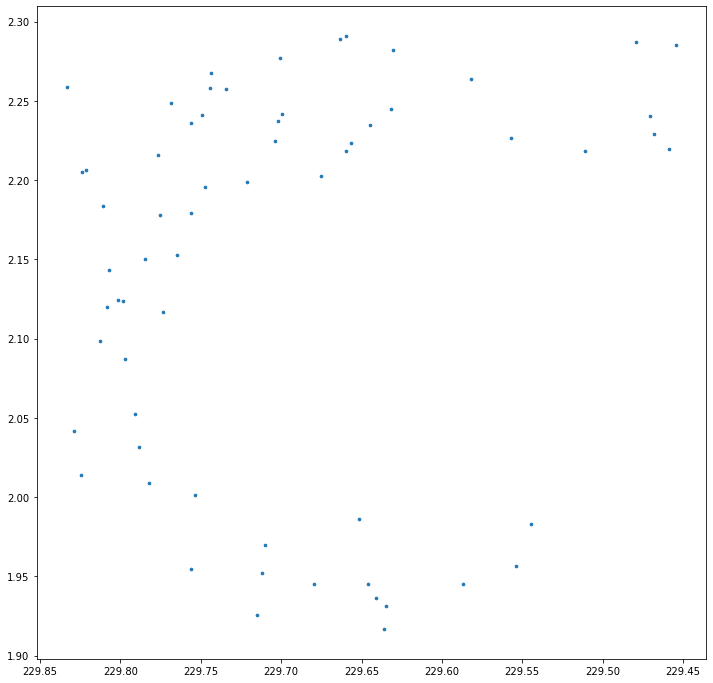

In [2]:
pos = coords.SkyCoord('15h18m33.75s 02d05m57.7s', frame='gcrs')
xid_spec = SDSS.query_region(pos, radius = '11.5m', spectro=True)
print(len(xid_spec))

plt.figure(figsize=(12,12))
plt.scatter(xid_spec['ra'],xid_spec['dec'],s=7)
plt.gca().invert_xaxis()
plt.show()

42174


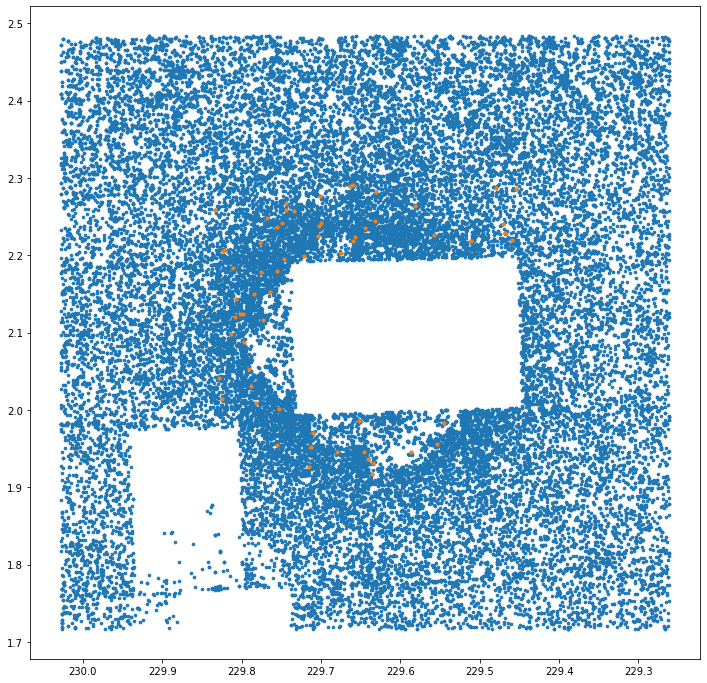

In [5]:
pos = coords.SkyCoord('15h18m33.75s 02d05m57.7s', frame='gcrs')
xid = SDSS.query_region(pos, radius = '23m')#, spectro=True)
print(len(xid))

plt.figure(figsize=(12,12))
plt.scatter(xid['ra'],xid['dec'],s=7)
plt.scatter(xid_spec['ra'],xid_spec['dec'],s=10)
plt.gca().invert_xaxis()
plt.show()

INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]


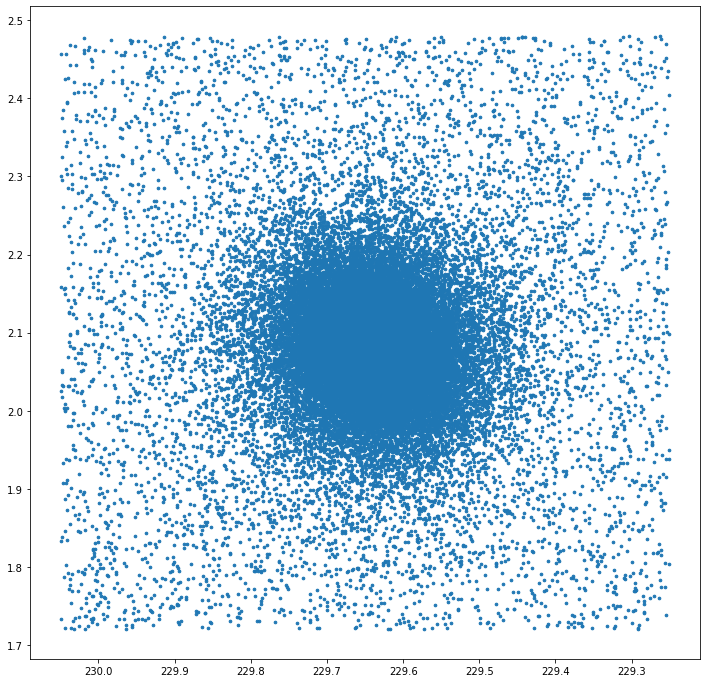

In [7]:
from astroquery.gaia import Gaia
query = '''select top 200000 ra, dec from gaiadr3.gaia_source
where ra between 229.25 and 230.05 and dec between 1.72 and 2.48'''

job = Gaia.launch_job_async(query)
r = job.get_results()

plt.figure(figsize=(12,12))
plt.scatter(r['ra'],r['dec'],s=7)
plt.gca().invert_xaxis()
plt.show()

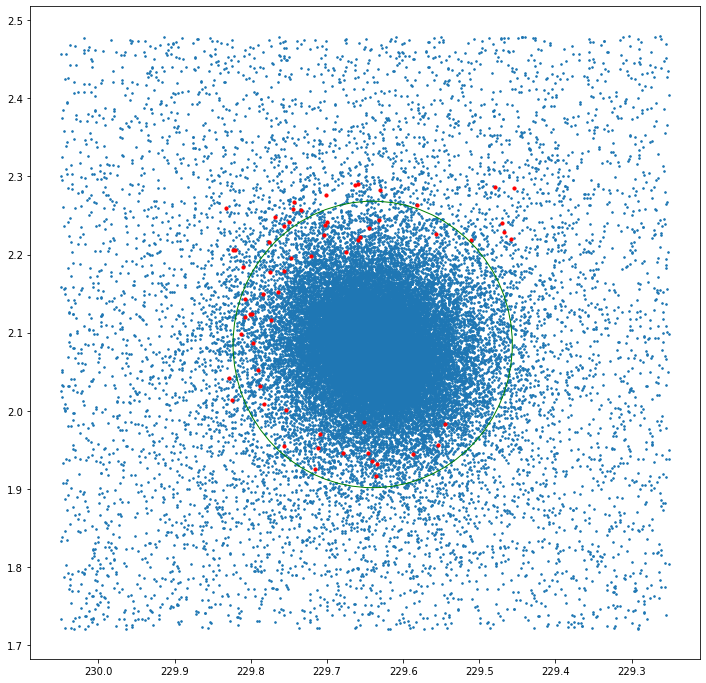

In [9]:
fig, ax = plt.subplots(figsize=(12,12))
plt.scatter(r['ra'],r['dec'],s=2.5)

plt.scatter(xid_spec['ra'],xid_spec['dec'],s=10, color = 'red')
c = plt.Circle((229.64,2.085),11/60,color='g',fill=False)
ax.add_patch(c)

plt.gca().invert_xaxis()
plt.show()

In [10]:
d = xid_spec
mask = (d['ra']-229.64)**2 + (d['dec']-2.085)**2 <= (11/60)**2
x = d[mask]

In [11]:
s = SDSS.get_spectra(matches = x)

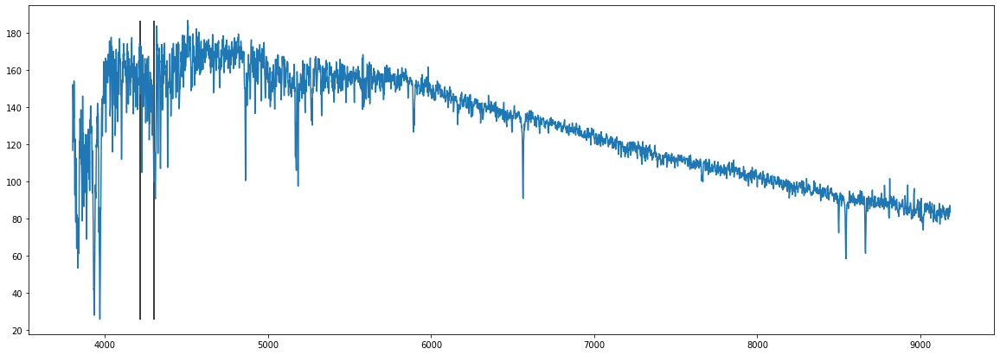

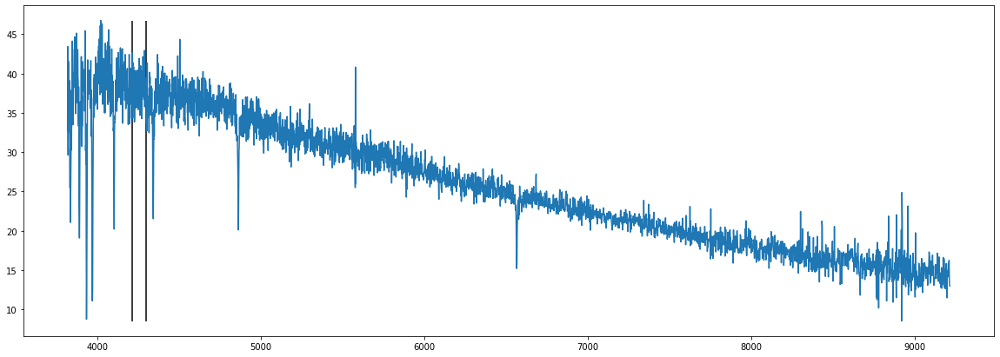

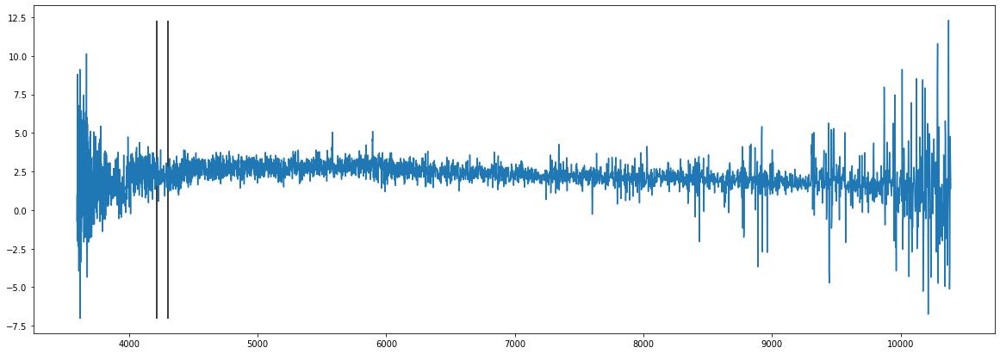

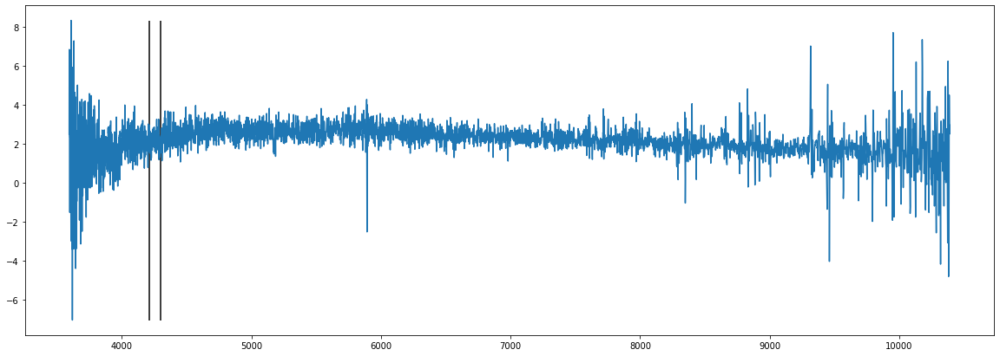

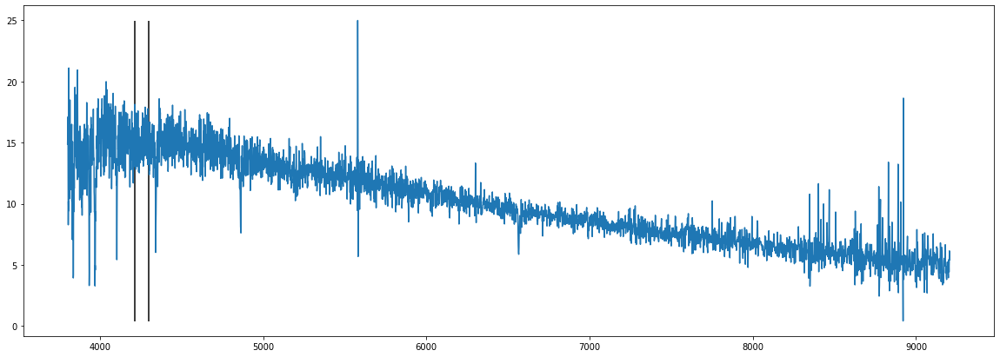

...

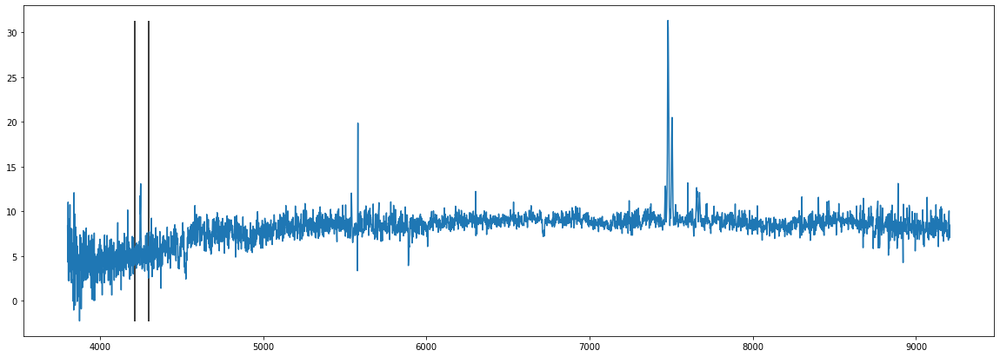

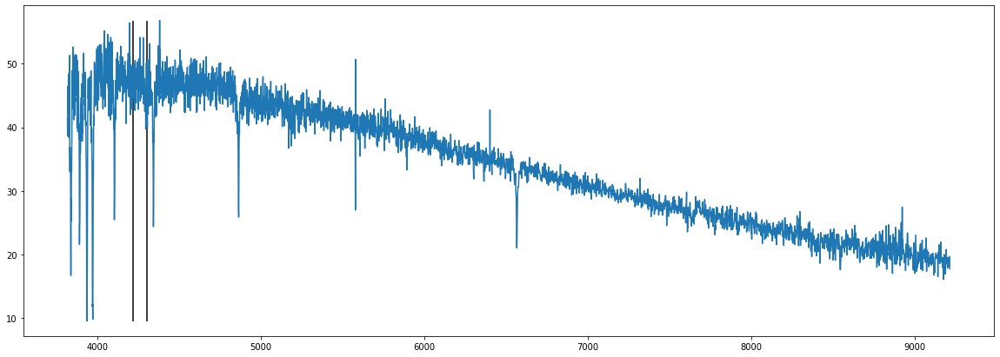

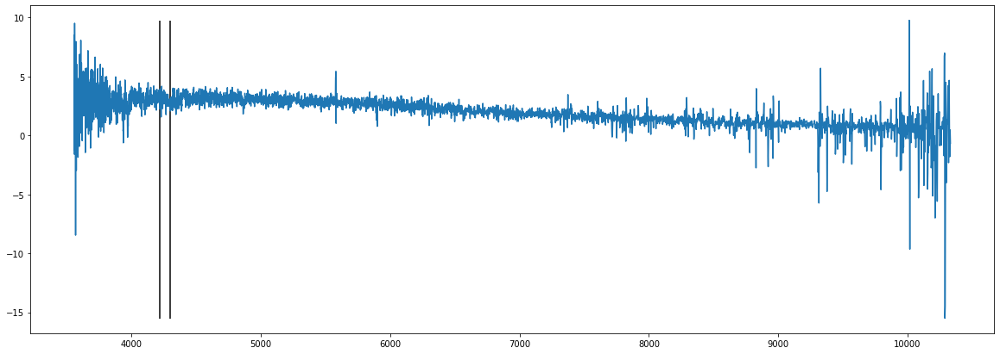

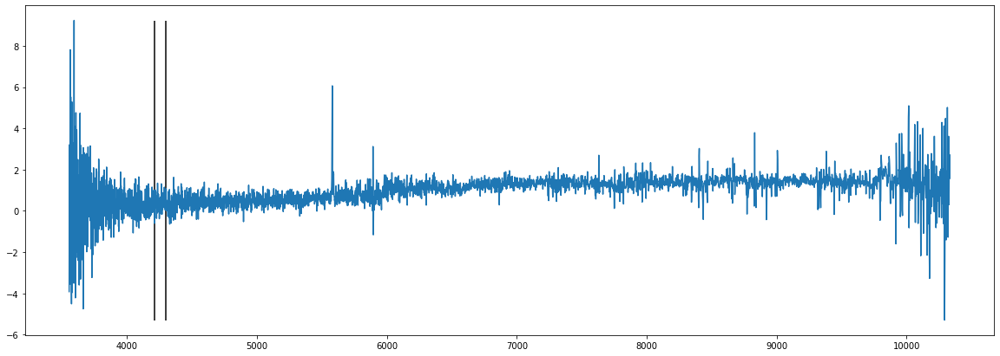

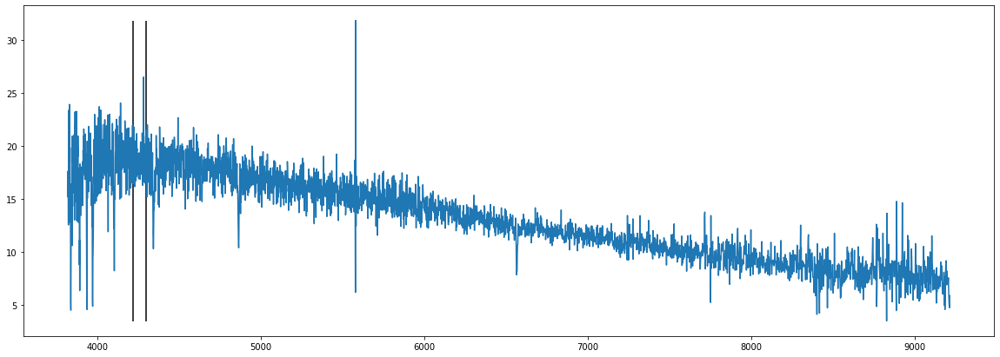

In [12]:
l = np.array([5876,4861,5694,4339,4100,5578,6564,5270])*(300000+53.7)/300000


# 5581, 7202, 7148 of calcium+1, also 4227 present where 5581 isn't
# 7231, 7236 of carbon, not present
# 7180 of H2O, not present
# 8407 of TiO - present in many!
# 3883 of cyanide - present in many! 4215 of cyanide - present in several as very short peak
# 7250 of Si+ - found in two
# 7601 of Ca++, found as broad peak in some
# 7657 of Mg+, long peak in image 25, short peak in 17, almost-peak in third
# 8184, 8194 of N+, Na+ small peaks in several, mostly first line
# 8213, 8221, 8234 of Mg,O,Mg have smaller peaks in few
# 6300 (can be O or Fe but seem Fe looking at Sneden et al) line present in many! 6158 Fe+ line also present in several, mainly in images towards end
# 6154, 6161 Na lines in several, two as prominent peaks in end
# 6300 zoom-in resolution : Fe line 6301.5 present in many, several have zig-zag or two-point peaks which means both O and Fe peaks present.


l = np.array([4300, 4215])#*(300000+53.7)/300000
for i in range(len(s)):
  a = s[i][1].data
  plt.figure(figsize=(20,7))
  #plt.xlim(4300)
  plt.plot(10**a['loglam'],a['flux'])#,s=2)
  plt.vlines(l,np.min(a['flux']),np.max(a['flux']))
  
  plt.show()

In [31]:
import warnings
warnings.simplefilter('ignore')
from scipy.signal import find_peaks
from specutils.fitting import fit_generic_continuum

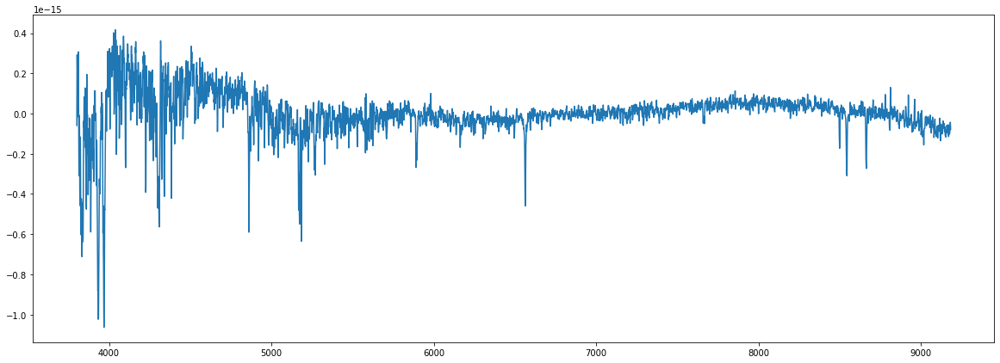

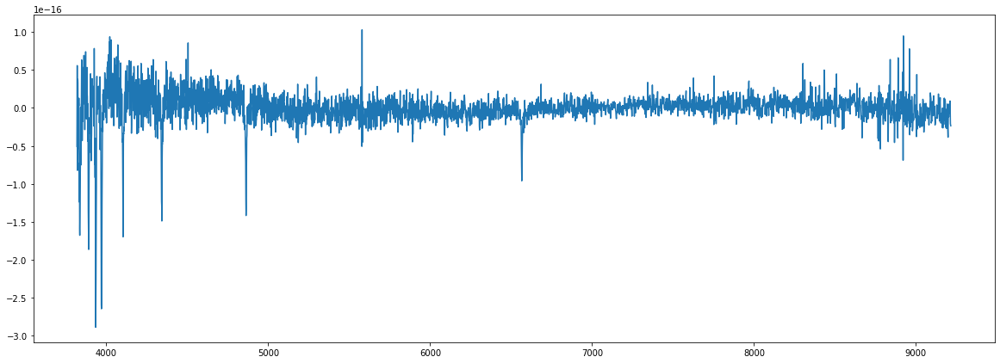

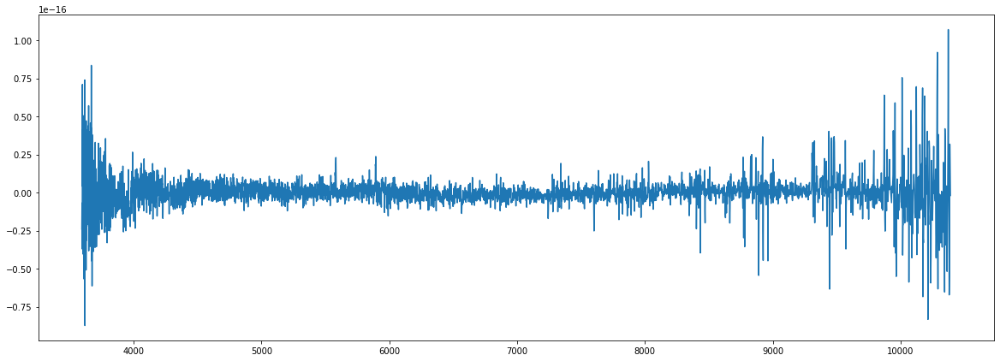

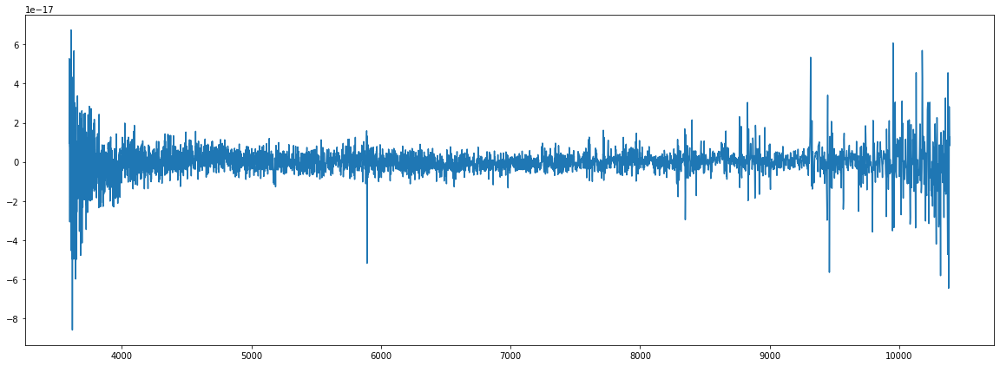

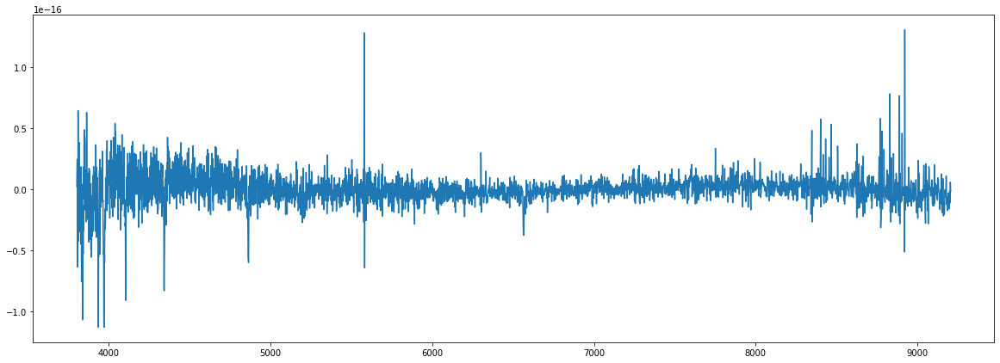

...

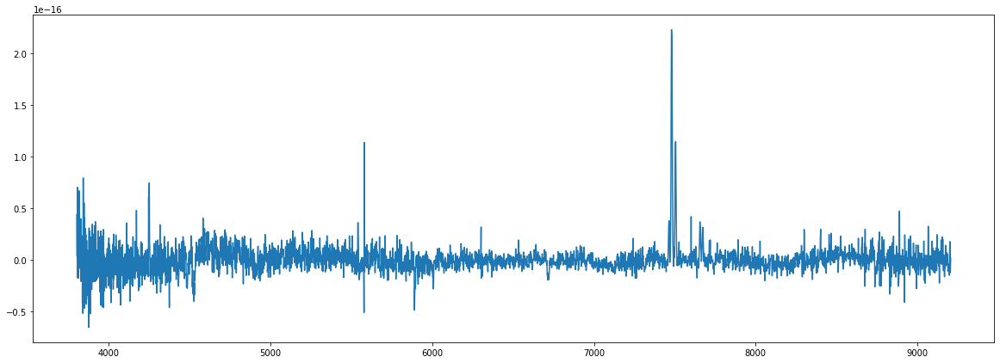

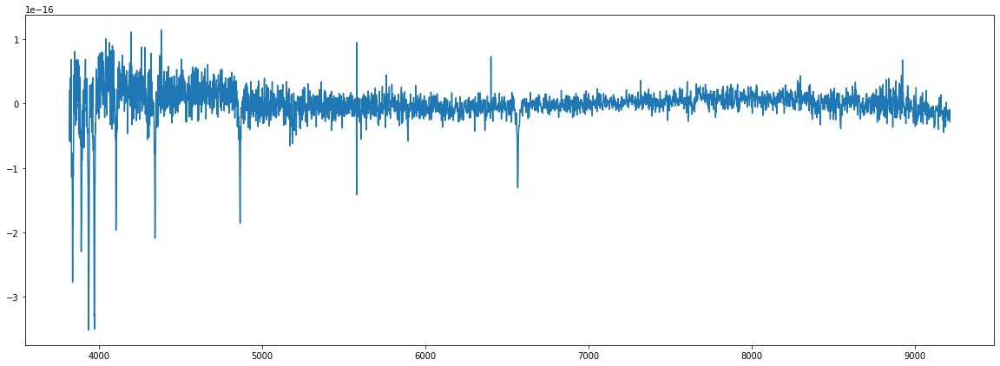

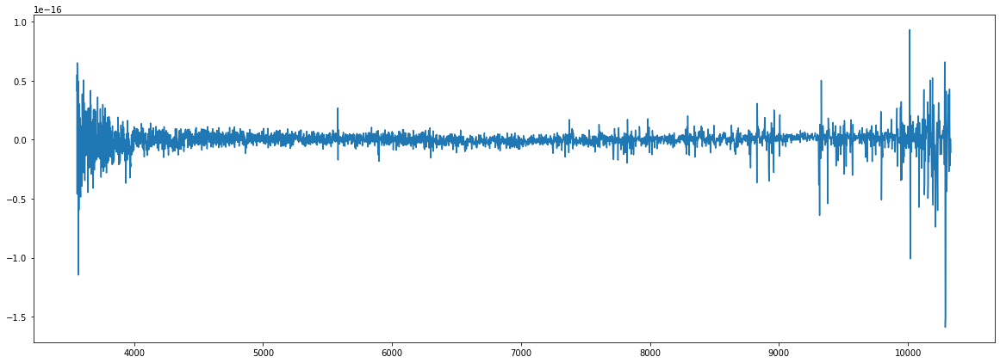

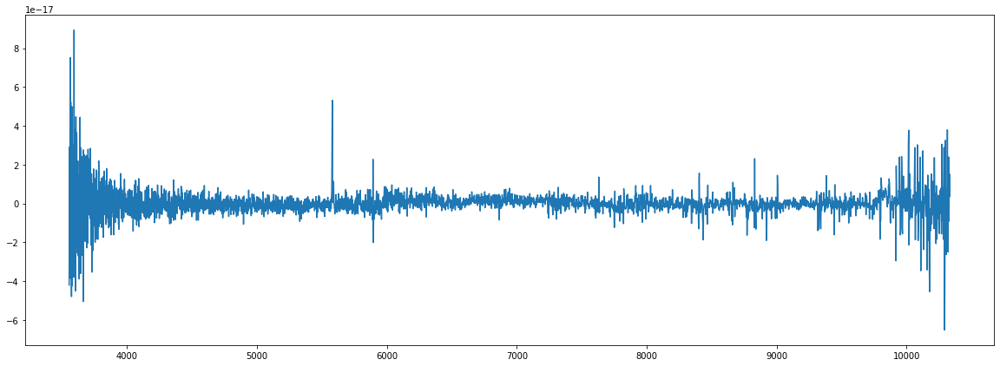

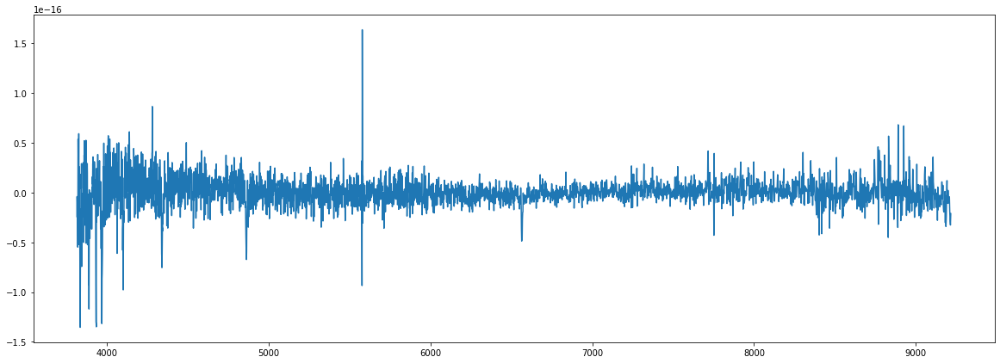

In [43]:
for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted

  fig, ax = plt.subplots(figsize = (20,7))  
  ax.plot(spec.spectral_axis, spec.flux) 

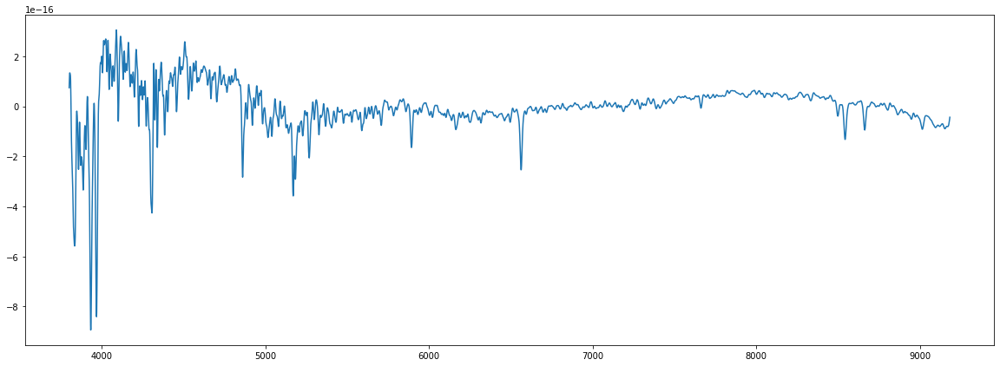

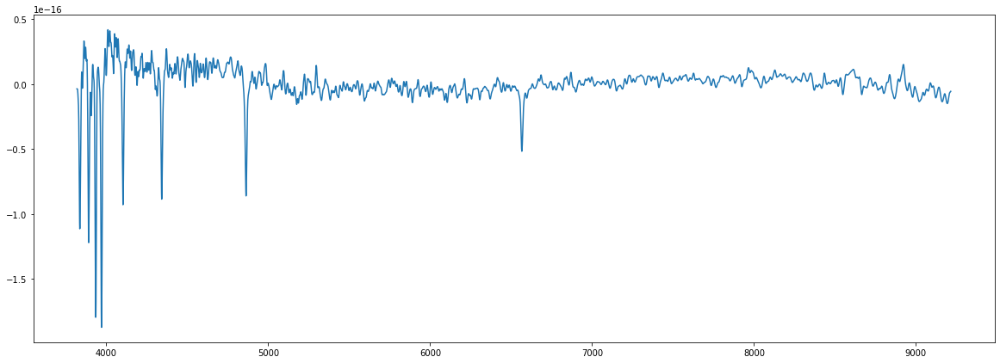

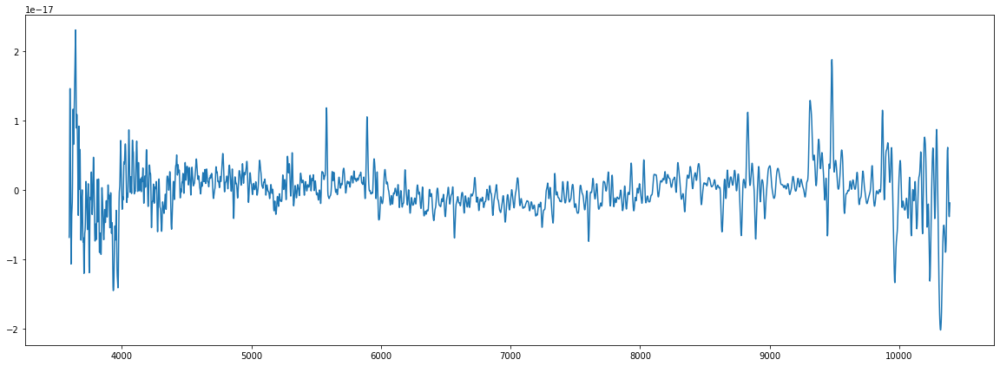

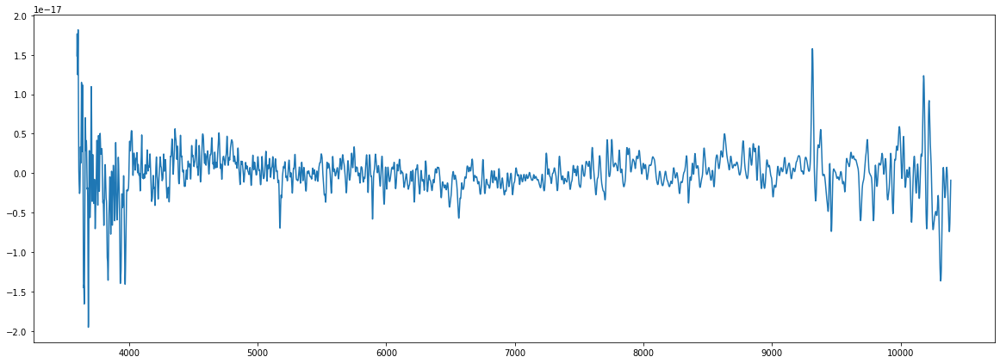

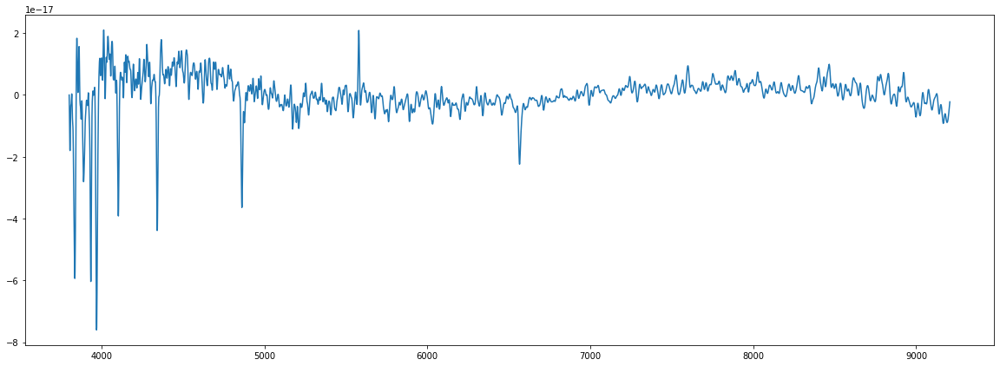

...

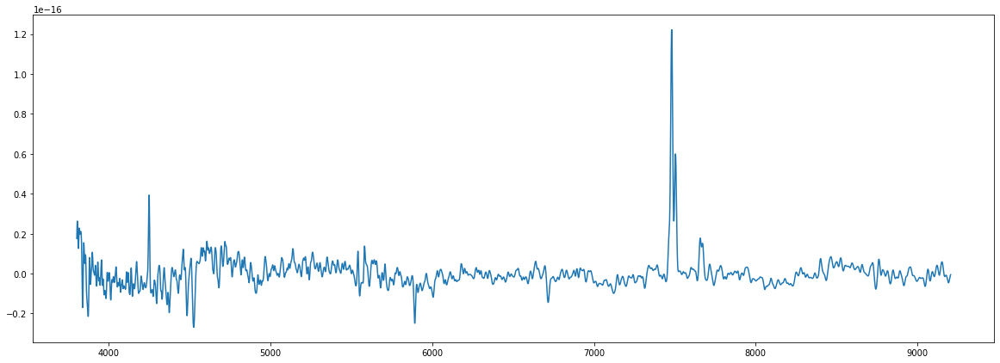

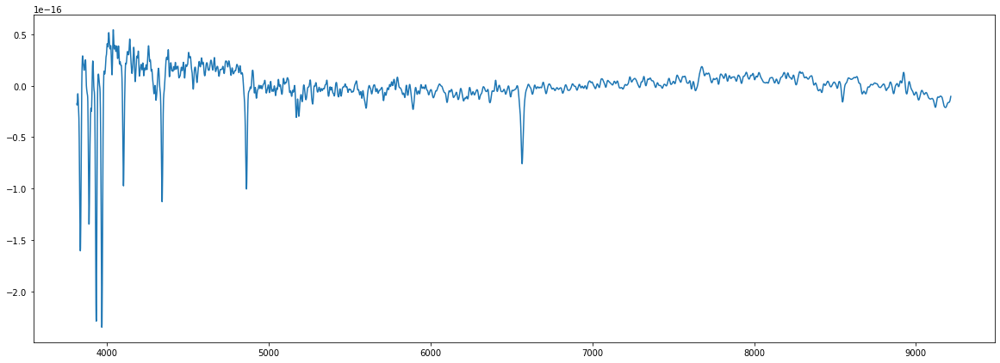

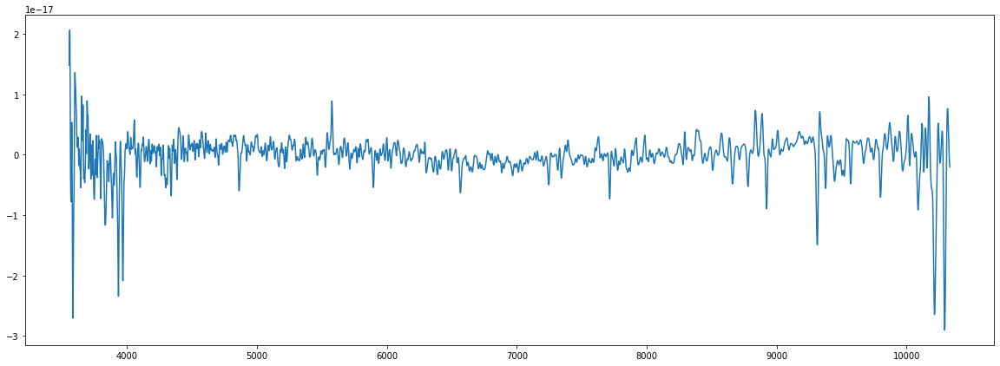

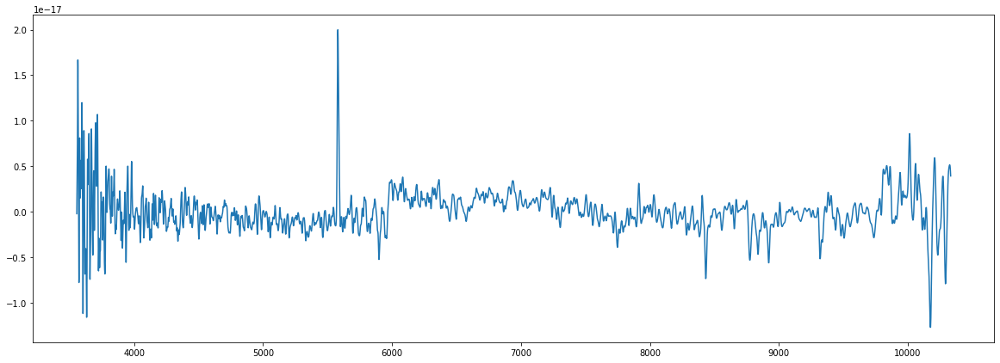

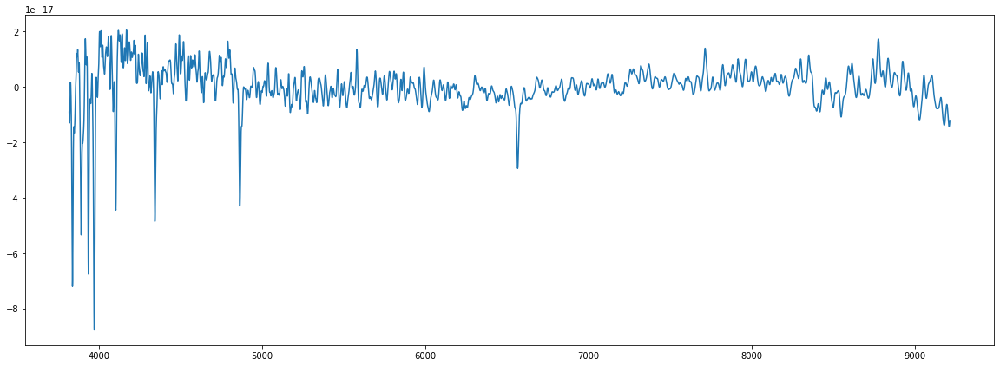

In [57]:
for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted
  spec = gaussian_smooth(spec, stddev=3)
  
  fig, ax = plt.subplots(figsize = (20,7))  
  ax.plot(spec.spectral_axis, spec.flux)

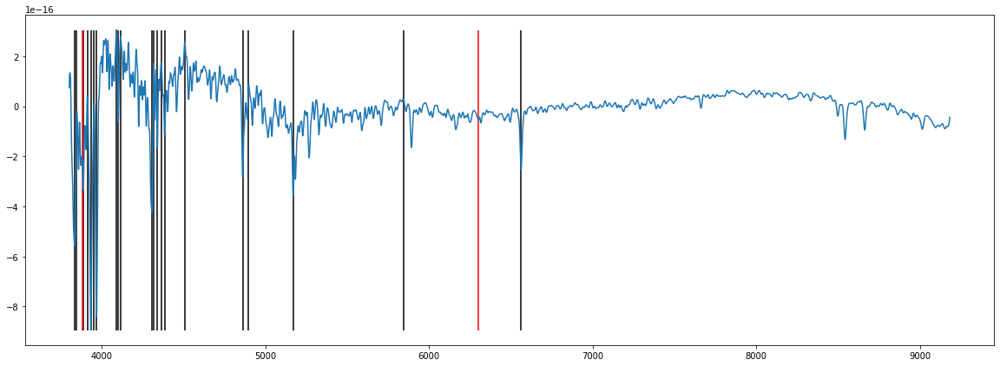

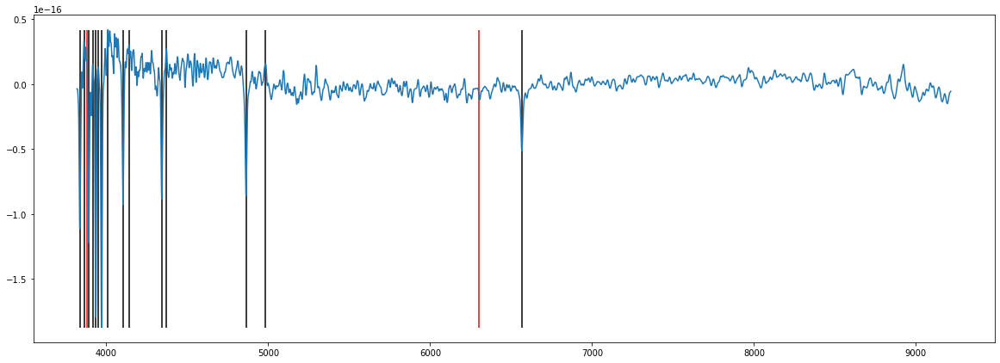

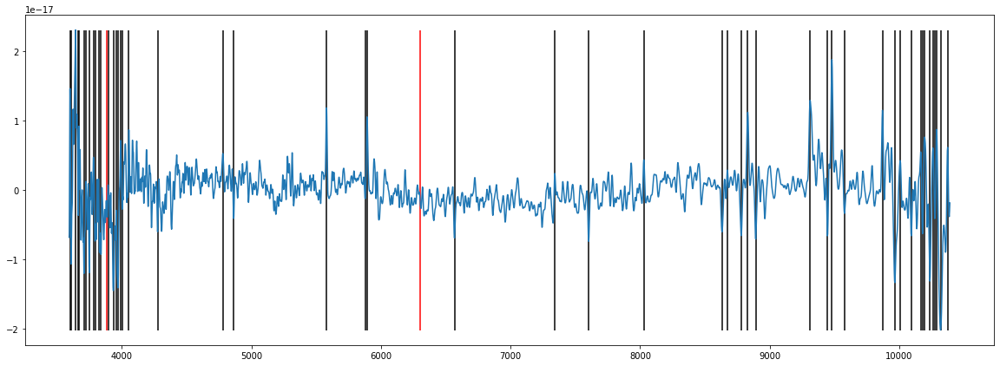

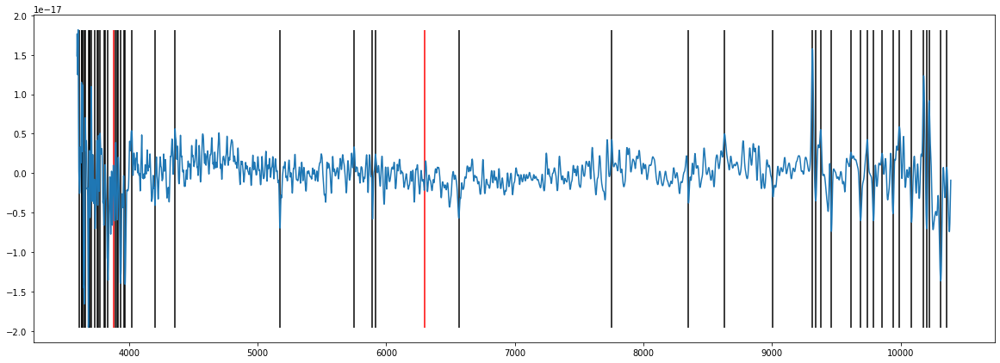

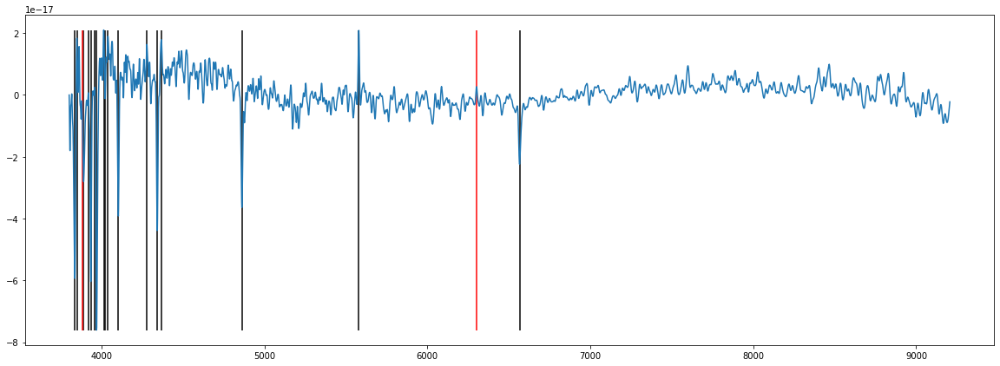

...

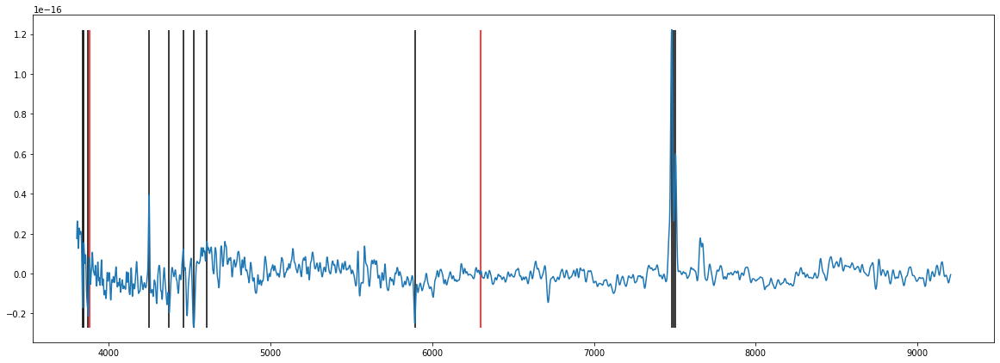

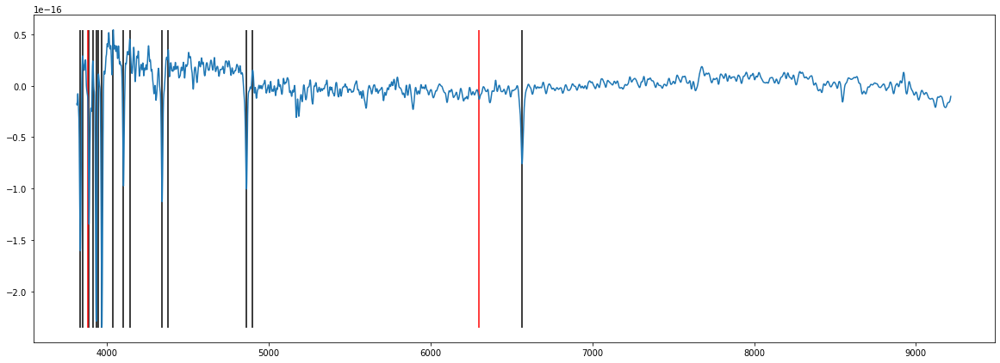

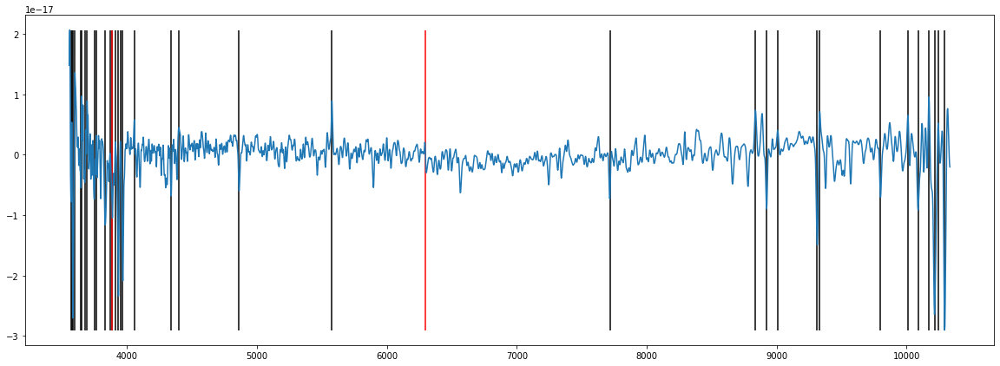

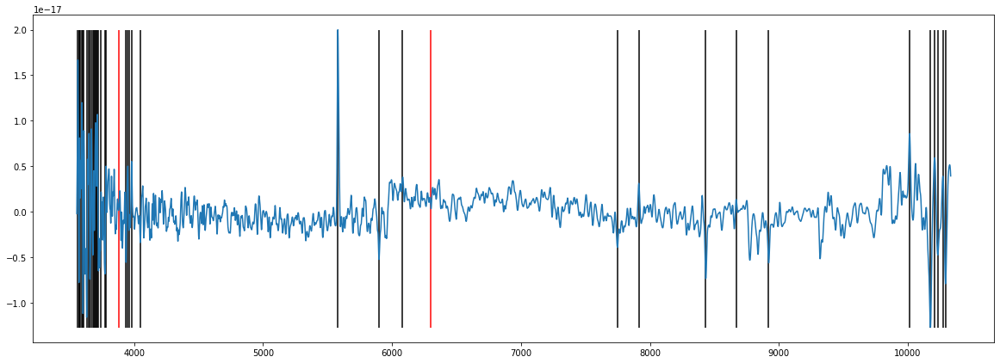

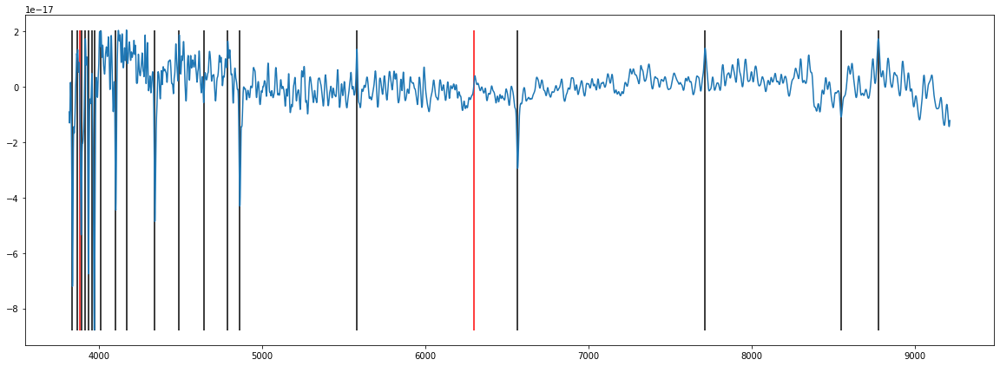

In [56]:
from specutils.manipulation import gaussian_smooth

for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)

  g1_fit = fit_generic_continuum(spec)
  y_continuum_fitted = g1_fit(lamb)

  spec -= y_continuum_fitted
  spec = gaussian_smooth(spec, stddev=3)

  d = np.array(spec.flux)
  d = d[~np.isnan(d)]
  h = (np.max(d) - np.min(d))/5
  p1 = find_peaks(d, prominence = h)
  p2 = find_peaks(-d, prominence = h)
  l = np.array(spec.spectral_axis)[np.concatenate((p1[0],p2[0]))]
  
  fig, ax = plt.subplots(figsize = (20,7))  
  ax.plot(spec.spectral_axis, spec.flux)
  ax.vlines(l,np.min(np.array(spec.flux)),np.max(np.array(spec.flux)))
  ax.vlines([6300,3883],np.min(np.array(spec.flux)),np.max(np.array(spec.flux)), color='r') 

In [48]:
np.array(spec.flux).shape

(3831,)

In [16]:
from specutils.manipulation import noise_region_uncertainty
from specutils import SpectralRegion

noise_region = SpectralRegion(0*u.um, 3*u.um)
spectrum = noise_region_uncertainty(spec, noise_region)

In [26]:
from specutils.fitting import find_lines_threshold, find_lines_derivative
from specutils.analysis import snr

In [36]:
for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)
  #spectrum = noise_region_uncertainty(spec, noise_region)
  lines = find_lines_threshold(spec, noise_factor=3)
  print(len(lines))

1
1
194
141
1
41
51
143
223
15
49
7
439
29
1
3
333
578
7
263
9
1
262
139
588
343
4
23
327
391
340
351
1
51
13
1
180
430
1


In [42]:
for i in range(len(s)):
  specdata = s[i][1].data
  lamb = 10**specdata['loglam'] * u.AA 
  flux = specdata['flux'] * 10**-17 * u.Unit('erg cm-2 s-1 AA-1') 
  spec = Spectrum1D(spectral_axis=lamb, flux=flux)
  #spectrum = noise_region_uncertainty(spec, noise_region)
  lines = find_lines_derivative(spec, flux_threshold = 11e-17)
  print(len(lines))

474
468
0
0
267
33
3
3
1
190
6
448
0
6
468
370
1
0
534
0
77
312
2
2
0
0
598
451
2
0
5
2
393
68
11
478
1
0
375
